In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
import seaborn as sns
import os
import pylab as pl
import random
import skimage
import numpy as np
import matplotlib.image as mpimg
import matplotlib.pylab as plt
from scipy.ndimage import affine_transform, zoom
from scipy import misc

In [2]:
os.chdir('C:/Users/Evangelina Garza/Documents/CIMAT/MCE_2Semestre/Ciencia de Datos/data_fruits_tarea')

In [3]:
sns.set()
%matplotlib inline

In [8]:
files = [f for f in os.listdir('.') if f[-3:] == 'jpg']

'Apple_Braeburn_101_100.jpg'

In [9]:
files2=np.array([files])
files2.shape

(1, 1300)

In [10]:
#Matriz resumen con medianas
im_m=np.zeros((files2.shape[1],3))
for i in range(files2.shape[1]):
    im = mpimg.imread("C:/Users/Evangelina Garza/Documents/CIMAT/MCE_2Semestre/Ciencia de Datos/data_fruits_tarea/"+files[i])
    medianR=np.median(im[:,:,0])
    medianG=np.median(im[:,:,1])
    medianB=np.median(im[:,:,2])
    im_m[i,0]=medianR
    im_m[i,1]=medianG
    im_m[i,2]=medianB    

In [11]:
im_m

array([[142.,  32.,  25.],
       [142.,  32.,  26.],
       [141.,  32.,  25.],
       ...,
       [131.,  36.,  28.],
       [129.,  36.,  29.],
       [122.,  28.,  22.]])

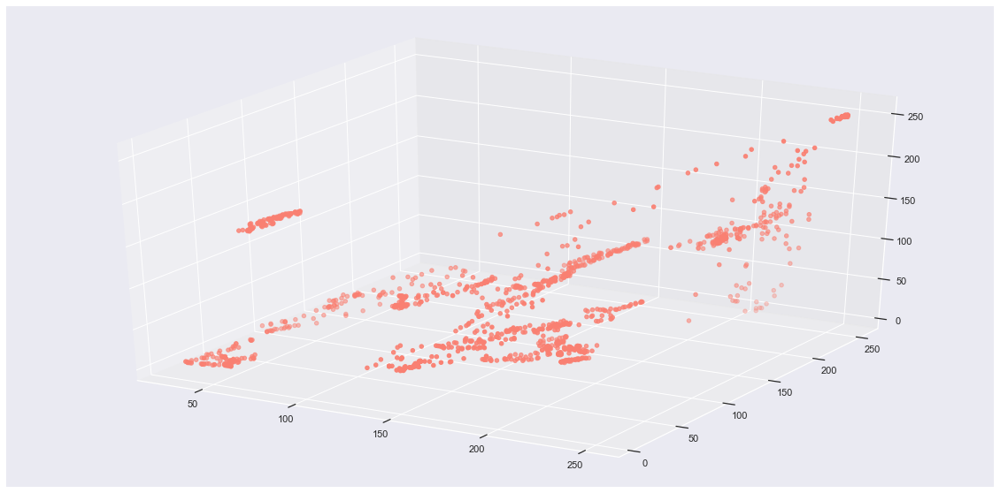

In [12]:
#Simple scatterplot en 3D de matriz de medianas
from mpl_toolkits import mplot3d
fig = plt.figure(figsize=(20,10))
ax = plt.axes(projection='3d')
ax.scatter3D(im_m[:,0], im_m[:,1], im_m[:,2], c='salmon')

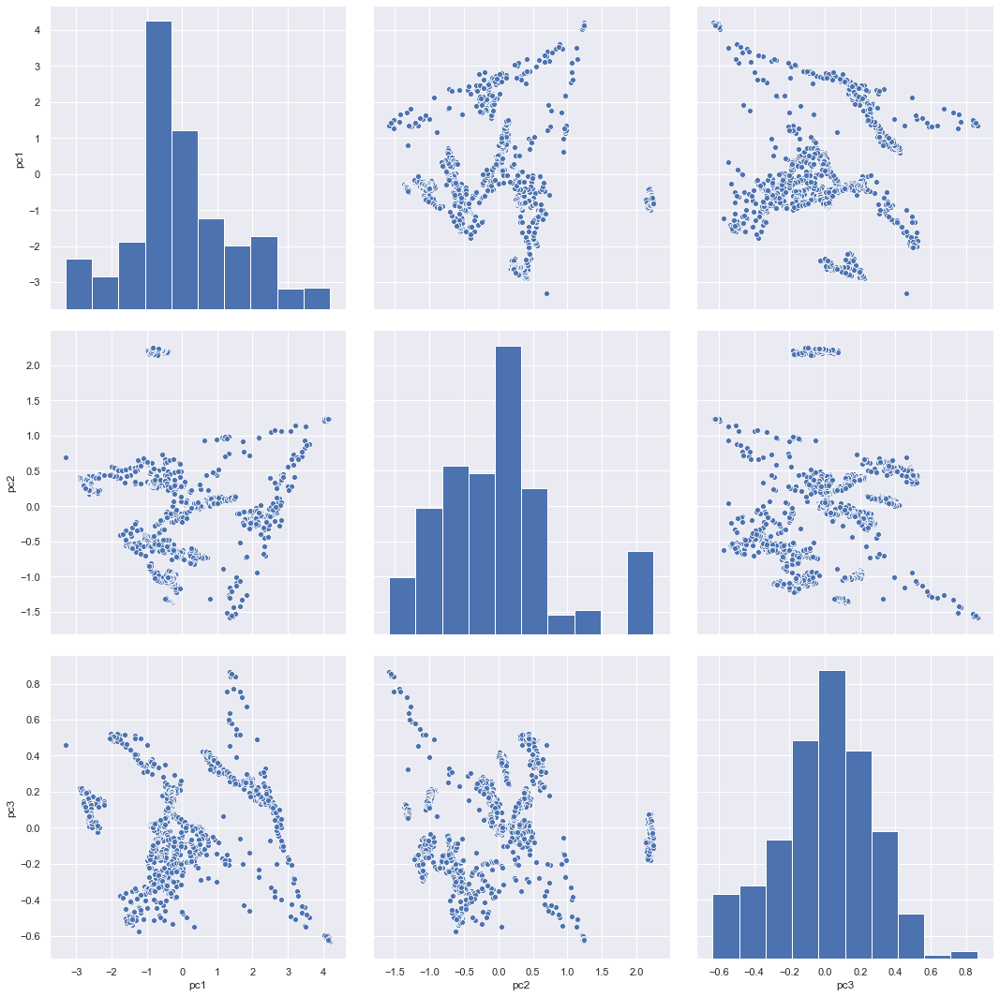

In [116]:
#Componentes principales
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
X = StandardScaler().fit_transform(im_m)
pca = PCA()
pca.fit(X)
proj = pd.DataFrame(pca.transform(X),columns = ['pc1','pc2','pc3'])
sns.set()
sns.pairplot(proj, height=5)

In [14]:
#Proyeccion en dos componentes principales
import plotly.express as px

pca_dataset = pd.DataFrame({'pc1': proj['pc1'], 'pc2': proj['pc2']})

fig = px.scatter(pca_dataset, x='pc1', y='pc2')
fig.update_layout(
    autosize=False,
    width=600,
    height=600,
)
fig.show()

In [15]:
images=[]
for j in range(1300):
    im = plt.imread(files[j])
    images.append(im)

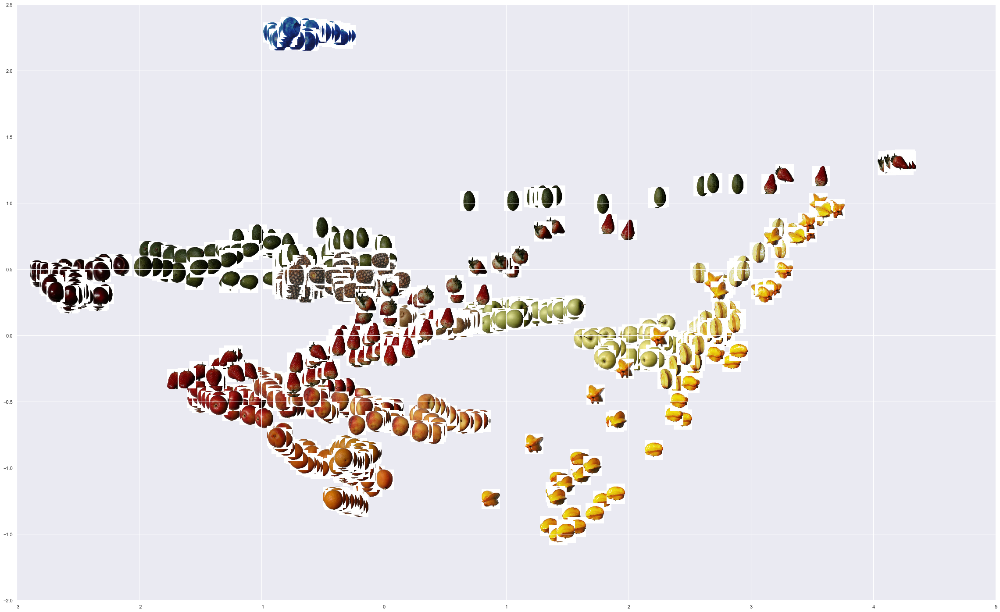

In [18]:
#Representacion de cada fruta por su proyeccion en dos componentes principales
from matplotlib import pyplot as plt
from matplotlib.image import BboxImage
from matplotlib.transforms import Bbox, TransformedBbox

X = proj['pc1']
Y = proj['pc2']

# Create figure
fig = plt.figure(figsize=(40.,25.))
ax = fig.add_subplot(111)


# Plots an image at each x and y location. 
def plotImage(xData, yData,im):
    for x, y, imi in zip(xData,yData,im):
        bb = Bbox.from_bounds(x,y,.15,.15)  
        bb2 = TransformedBbox(bb,ax.transData)
        bbox_image = BboxImage(bb2,
                            norm = None,
                            origin=None,
                            clip_on=False)
        bbox_image.set_data(imi)
        ax.add_artist(bbox_image)

ax.set_ylim(-2,2.5)
ax.set_xlim(-3,5)
plotImage(X, Y, images)
plt.show()

In [35]:
#Metodo Kernel PCA
kpca = KernelPCA(n_components=3,kernel="rbf", fit_inverse_transform=True, gamma=0.00006)
X_kpca = kpca.fit_transform(im_m)
X_back = kpca.inverse_transform(X_kpca)
X_kpca

array([[-0.49021987, -0.01495658, -0.32843507],
       [-0.4901528 , -0.01540647, -0.32351858],
       [-0.49249925, -0.00844626, -0.32797704],
       ...,
       [-0.51421495,  0.03987295, -0.2926234 ],
       [-0.51749096,  0.05440615, -0.28569046],
       [-0.52139354,  0.14496035, -0.3477045 ]])

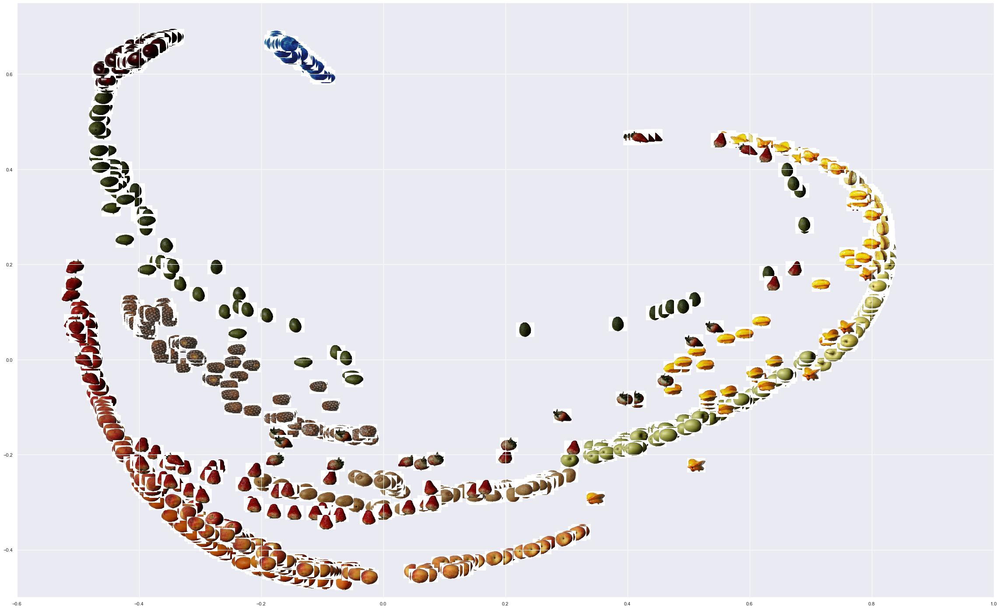

In [95]:
#Representacion Kernel PCA de las frutas
X = X_kpca[:,0]
Y = X_kpca[:,1]

fig = plt.figure(figsize=(40.,25.))
ax = fig.add_subplot(111)

ax.set_ylim(-0.5,0.75)
ax.set_xlim(-0.6,1)
plotImage(X, Y, images)
plt.show()

In [41]:
def my_kmeans(z,kk):
    indices = list(range(0,z.shape[0]))
    ix = random.sample(indices,k=kk)
    centroides=np.zeros((kk,z.shape[1]))
    d=np.zeros((z.shape[0],kk))
    
    for i in range(kk):
            j=ix[i]
            centroides[i,]=z[j,]
    
    temp=0
    c = []
    new_centroides=centroides
    flag=0
    
    while flag == 0:
        for p in range(z.shape[0]):
            for l in range(kk):
                d[p,l]=sum(((z[p,:]-new_centroides[l,:])**2))
    
        for a in range(z.shape[0]):
            lista = d[a,:]
            lista = lista.tolist()
            m=lista.index(min(lista))
            c.append(m)
    
        cont=np.zeros((kk,z.shape[1]))
        for k in range(kk):
            for j in range(z.shape[0]):
                if c[j] == k:
                    new_centroides[k,]=new_centroides[k,]+z[j,]
                    cont[k,]=cont[k,]+1
        
        new_centroides = new_centroides/cont
        
        if temp==0:
            ant=c
            flag=0
        else:
            if ant == c:
                flag=1
            else:
                ant=c
                flag=0
                
        temp=temp+1
        c=[]
    
    return ant,new_centroides

In [53]:
x1=proj['pc1']
x2=proj['pc2']
X=np.array([x1,x2])
X=np.transpose(X)

In [54]:
clasi,centros = my_kmeans(X,10)

In [55]:
X_new=np.column_stack((X, clasi))

In [56]:
c_map = {0: 'steelblue', 1: 'teal', 2: 'aquamarine',
         3: 'darkorange', 4: 'gold', 5: 'yellowgreen',
         6: 'palegreen', 7: 'pink', 8: 'magenta', 9: 'violet'}

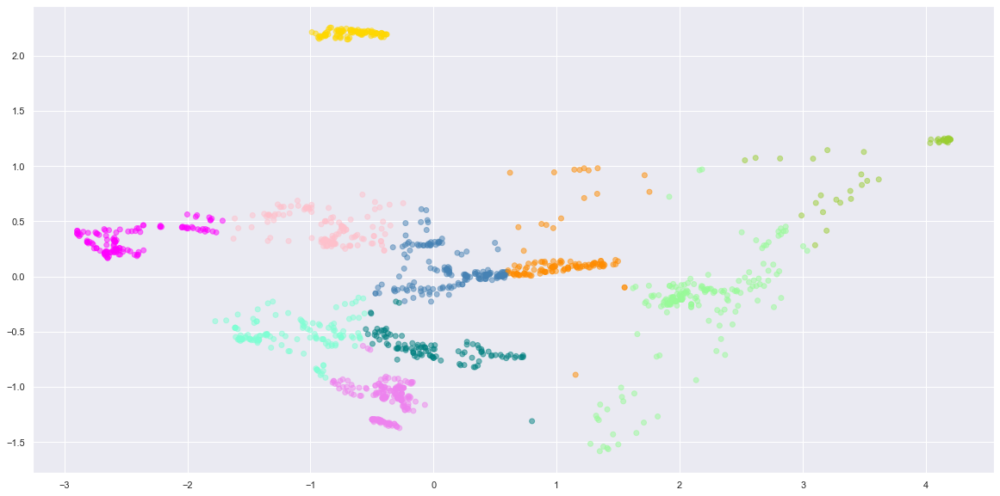

In [57]:
#K-means para la informacion proyectada en dos componentes principales
plt.figure(figsize=(20,10))
plt.scatter(X_new[:,0], X_new[:,1], c=[c_map[_] for _ in X_new[:,2]], alpha=0.5)
plt.show()

### Clustering Kernel PCA 

In [58]:
from sklearn.cluster import SpectralClustering
clustering = SpectralClustering(n_clusters=10,
                                assign_labels="discretize",
                                random_state=0).fit(X)
clustering.labels_

array([1, 1, 1, ..., 1, 1, 1], dtype=int64)

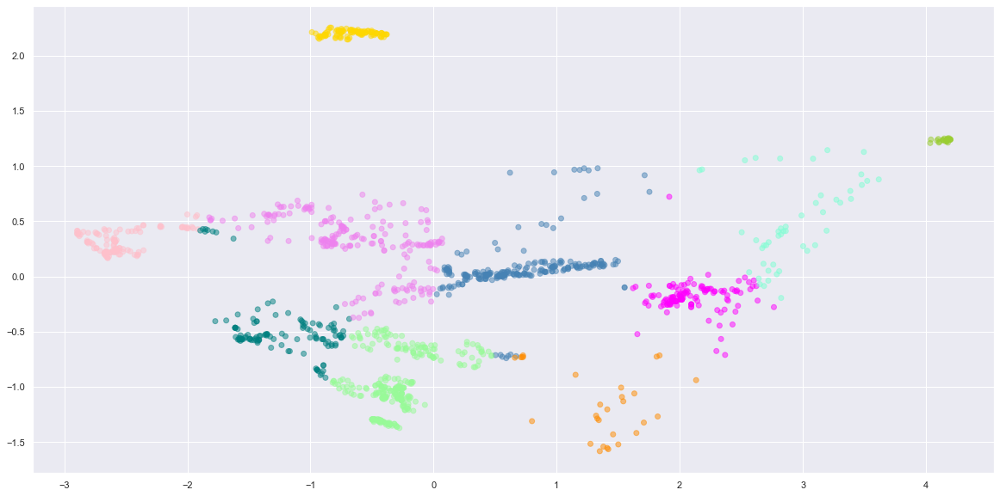

In [59]:
X_new_k=np.column_stack((X, clustering.labels_))

plt.figure(figsize=(20,10))
plt.scatter(X_new_k[:,0], X_new_k[:,1], c=[c_map[_] for _ in X_new_k[:,2]], alpha=0.5)
plt.show()

<Figure size 432x288 with 0 Axes>

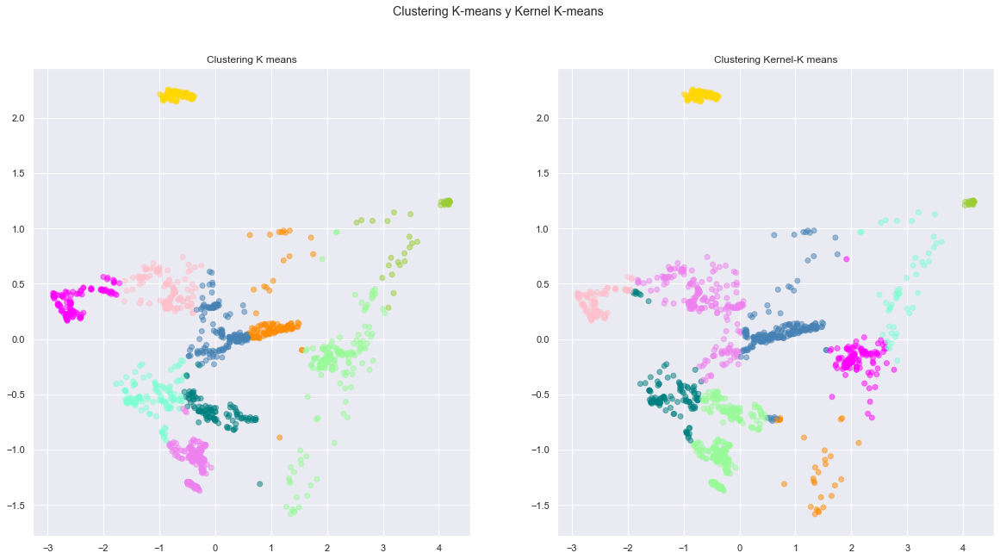

In [61]:
#Comparacion
fig = plt.figure() 
fig, axes = plt.subplots(nrows = 1, ncols = 2,figsize=(20,10))

fig.suptitle('Clustering K-means y Kernel K-means')
axes[0].scatter(X_new[:,0], X_new[:,1], c=[c_map[_] for _ in X_new[:,2]], alpha=0.5)
axes[0].title.set_text('Clustering K means')
axes[1].scatter(X_new_k[:,0], X_new_k[:,1], c=[c_map[_] for _ in X_new_k[:,2]], alpha=0.5)
axes[1].title.set_text('Clustering Kernel-K means')

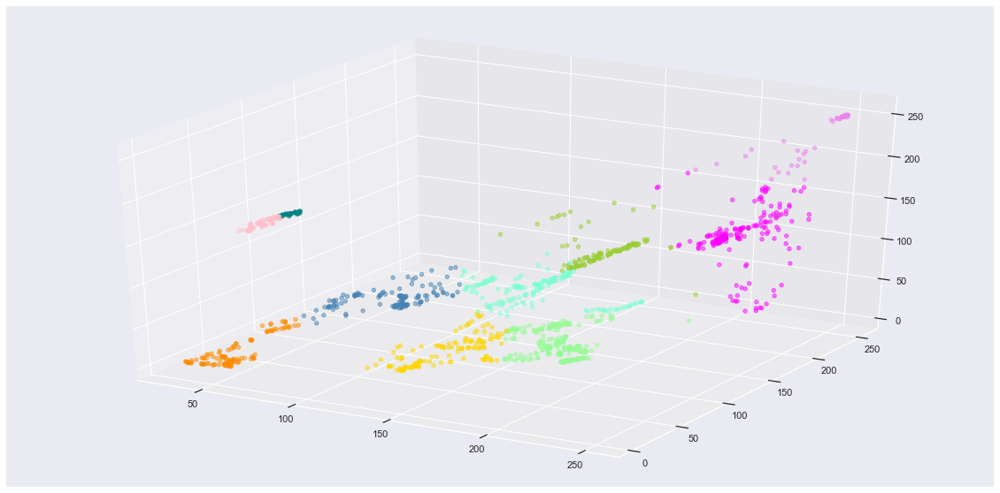

In [63]:
#Clustering sobre matriz de medianas original, sin tratamiento
clas_im,centros_im = my_kmeans(im_m,10)
im_new=np.column_stack((im_m, clas_im))


fig = plt.figure(figsize=(20,10))
ax = plt.axes(projection='3d')
ax.scatter3D(im_new[:,0], im_new[:,1], im_new[:,2], c=[c_map[_] for _ in im_new[:,3]], alpha=0.5)

## Espacio HSV

In [79]:
import skimage
print(skimage.__version__)
import numpy as np
from PIL import Image, ImageFont, ImageDraw
from PIL.ImageChops import add, subtract, multiply, difference, screen
import PIL.ImageStat as stat
from skimage.io import imread, imsave, imshow, show, imread_collection, imshow_collection
from skimage import color, viewer, exposure, img_as_float, data
from skimage.transform import SimilarityTransform, warp, swirl
from skimage.util import invert, random_noise, montage
import matplotlib.image as mpimg
import matplotlib.pylab as plt
from scipy.ndimage import affine_transform, zoom
from scipy import misc

0.15.0


C:\Anaconda3\lib\site-packages\skimage\viewer\utils\core.py:10: UserWarning:

Recommended matplotlib backend is `Agg` for full skimage.viewer functionality.



In [66]:
im.shape

(100, 100, 3)

In [77]:
im_r=im[:,:,0]
q_r=np.quantile(im_r, 0.5)

122.0

In [81]:
#Matriz de cuantiles
im_hsv=np.zeros((files2.shape[1],9))
for i in range(files2.shape[1]):
    im = mpimg.imread("C:/Users/Evangelina Garza/Documents/CIMAT/MCE_2Semestre/Ciencia de Datos/data_fruits_tarea/"+files[i])
    hsv = color.rgb2hsv(im)
    
    im_h=hsv[:,:,0]
    q_h1=np.quantile(im_h, 0.25)
    q_h2=np.quantile(im_h, 0.5)
    q_h3=np.quantile(im_h, 0.75)
    
    im_s=hsv[:,:,1]
    q_s1=np.quantile(im_s, 0.25)
    q_s2=np.quantile(im_s, 0.5)
    q_s3=np.quantile(im_s, 0.75)
    
    im_v=hsv[:,:,2]
    q_v1=np.quantile(im_v, 0.25)
    q_v2=np.quantile(im_v, 0.5)
    q_v3=np.quantile(im_v, 0.75)
    
    im_hsv[i,0]=q_h1
    im_hsv[i,1]=q_h2
    im_hsv[i,2]=q_h3
    im_hsv[i,3]=q_s1
    im_hsv[i,4]=q_s2
    im_hsv[i,5]=q_s3
    im_hsv[i,6]=q_v1
    im_hsv[i,7]=q_v2
    im_hsv[i,8]=q_v3

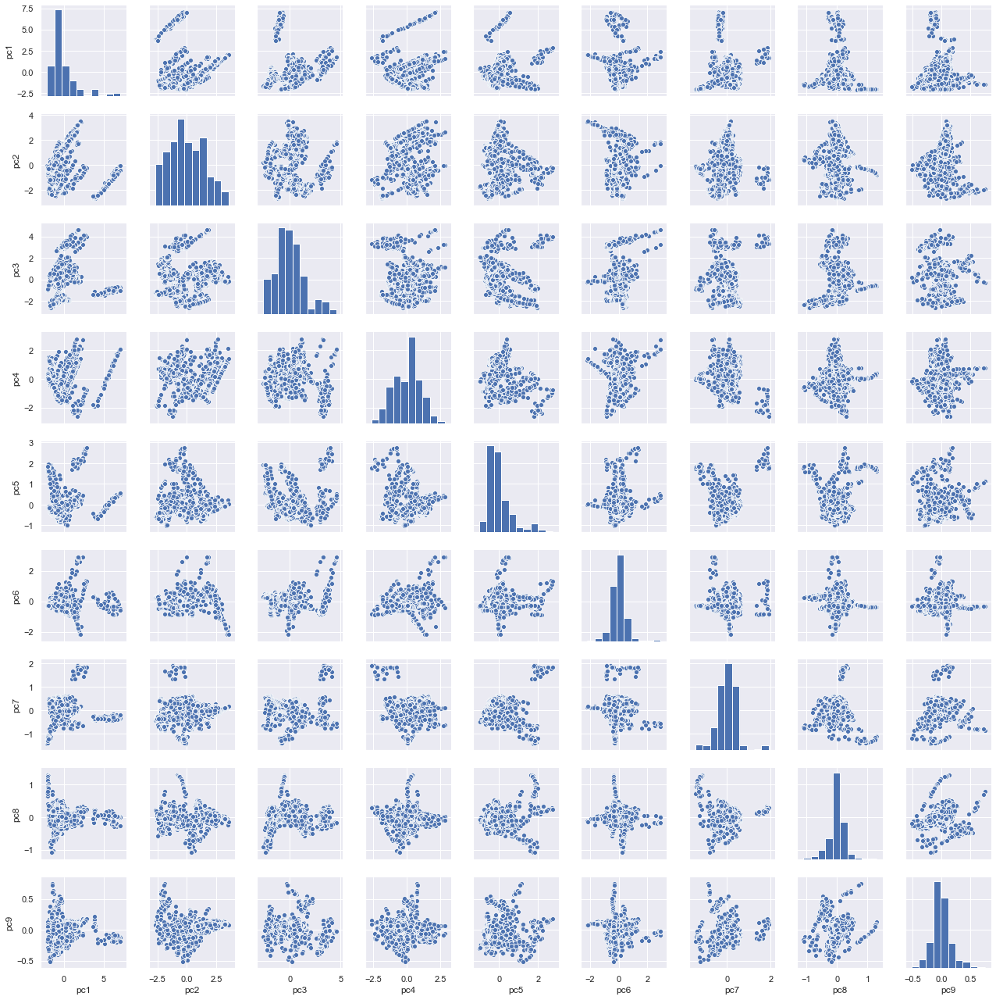

In [85]:
X_hsv = StandardScaler().fit_transform(im_hsv)
pca = PCA()
pca.fit(X_hsv)
proj_hsv = pd.DataFrame(pca.transform(X_hsv),columns = ['pc1','pc2','pc3','pc4','pc5','pc6','pc7','pc8','pc9'])
sns.set()
sns.pairplot(proj, height=2, palette='husl')

In [86]:
#Proyeccion sobre primeros dos componentes principales
pca_hsv = pd.DataFrame({'pc1': proj_hsv['pc1'], 'pc2': proj_hsv['pc2']})

fig = px.scatter(pca_hsv, x='pc1', y='pc2')
fig.update_layout(
    autosize=False,
    width=600,
    height=600,
)
fig.show()

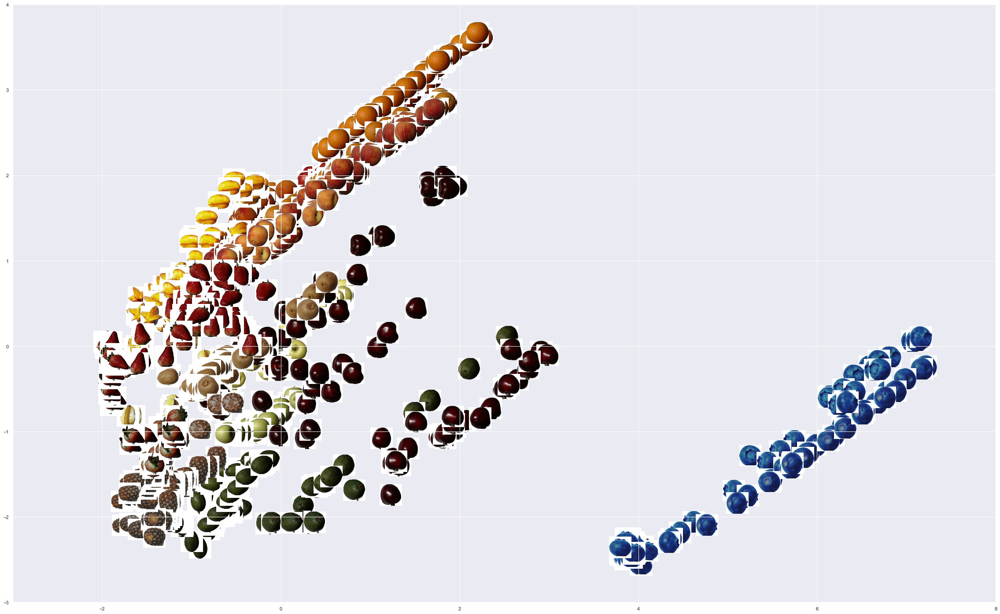

In [97]:
#Representacion de frutas sobre sus dos componentes principales
X_hsv = proj_hsv['pc1']
Y_hsv = proj_hsv['pc2']

fig = plt.figure(figsize=(40.,25.))
ax = fig.add_subplot(111)

#Redefinimos la funcion para ajustar parametros a este modelo
def plotImage(xData, yData,im):
    for x, y, imi in zip(xData,yData,im):
        bb = Bbox.from_bounds(x,y,.25,.25)  
        bb2 = TransformedBbox(bb,ax.transData)
        bbox_image = BboxImage(bb2,
                            norm = None,
                            origin=None,
                            clip_on=False)
        bbox_image.set_data(imi)
        ax.add_artist(bbox_image)

ax.set_ylim(-3,4)
ax.set_xlim(-3,8)
plotImage(X_hsv, Y_hsv, images)
plt.show()

In [108]:
#Metodo kernel PCA a la matriz de cuantiles en espacio HSV
kpca = KernelPCA(n_components=3,kernel="rbf", fit_inverse_transform=True, gamma=6)
X_hsv_kpca = kpca.fit_transform(im_hsv)
X_hsv_back = kpca.inverse_transform(X_hsv_kpca)
X_hsv_kpca

array([[ 0.51063312,  0.01866157, -0.22101772],
       [ 0.50561917,  0.01327169, -0.22590642],
       [ 0.50225516,  0.01400576, -0.22589498],
       ...,
       [ 0.389393  , -0.00764499, -0.23922136],
       [ 0.36904762, -0.02011899, -0.25716713],
       [ 0.29240692,  0.09435935, -0.13543193]])

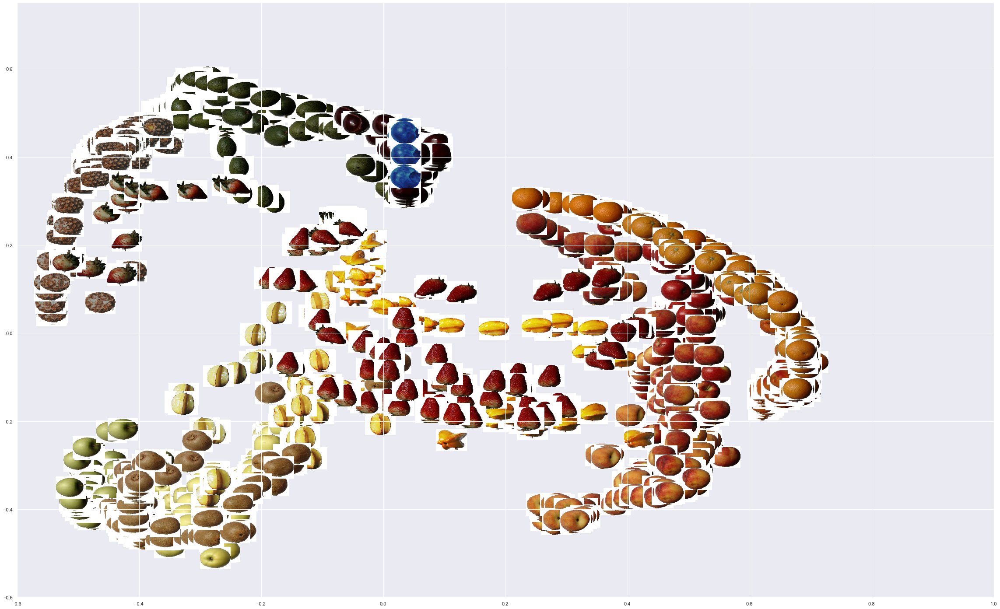

In [111]:
#Redefinimos la funcion para ajustar parametros
def plotImage(xData, yData,im):
    for x, y, imi in zip(xData,yData,im):
        bb = Bbox.from_bounds(x,y,.05,.05)  
        bb2 = TransformedBbox(bb,ax.transData)
        bbox_image = BboxImage(bb2,
                            norm = None,
                            origin=None,
                            clip_on=False)
        bbox_image.set_data(imi)
        ax.add_artist(bbox_image)

X_hsv = X_hsv_kpca[:,0]
Y_hsv = X_hsv_kpca[:,1]

fig = plt.figure(figsize=(40.,25.))
ax = fig.add_subplot(111)

ax.set_ylim(-0.6,0.75)
ax.set_xlim(-0.6,1)
plotImage(X_hsv, Y_hsv, images)
plt.show()

In [112]:
#Kmeans clustering sobre datos proyectados en los dos primeros componentes principales
xh1=proj_hsv['pc1']
xh2=proj_hsv['pc2']
X_hsv=np.array([xh1,xh2])
X_hsv=np.transpose(X_hsv)

c_hsv,ce_hsv = my_kmeans(X_hsv,10)

X_hsv_new=np.column_stack((X_hsv, c_hsv))

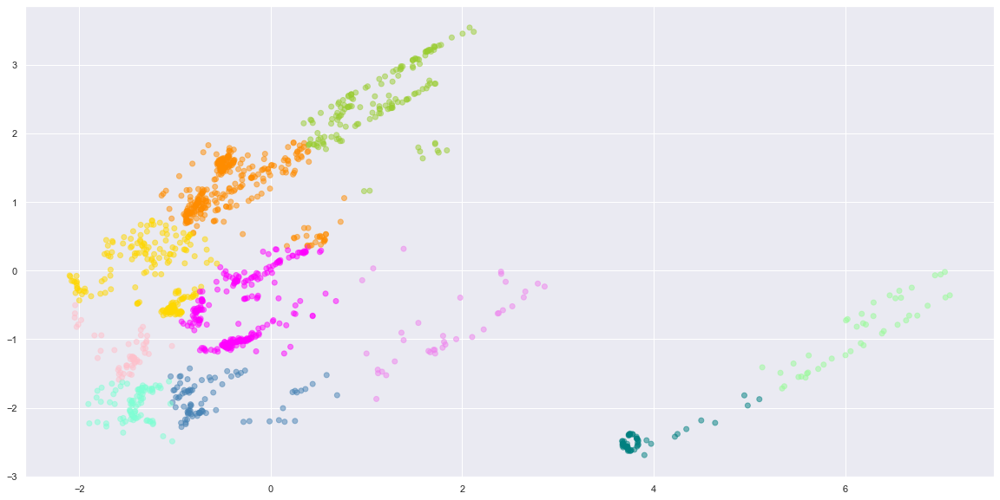

In [113]:
plt.figure(figsize=(20,10))
plt.scatter(X_hsv_new[:,0], X_hsv_new[:,1], c=[c_map[_] for _ in X_hsv_new[:,2]], alpha=0.5)
plt.show()

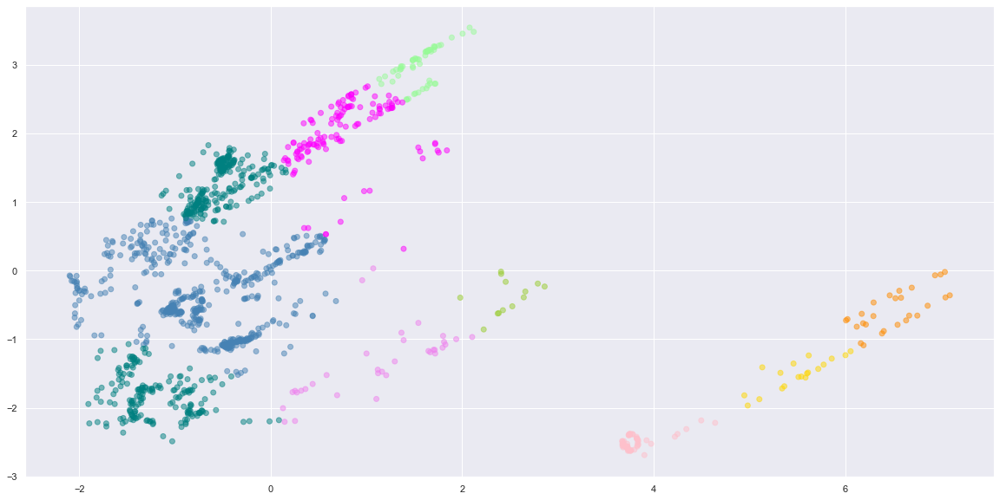

In [114]:
#Kernel K means sobre datos proyectados en dos componentes principales
clustering_hsv = SpectralClustering(n_clusters=10,
                                assign_labels="discretize",
                                random_state=0).fit(X_hsv)

X_new_kh=np.column_stack((X_hsv, clustering_hsv.labels_))

plt.figure(figsize=(20,10))
plt.scatter(X_new_kh[:,0], X_new_kh[:,1], c=[c_map[_] for _ in X_new_kh[:,2]], alpha=0.5)
plt.show()

<Figure size 432x288 with 0 Axes>

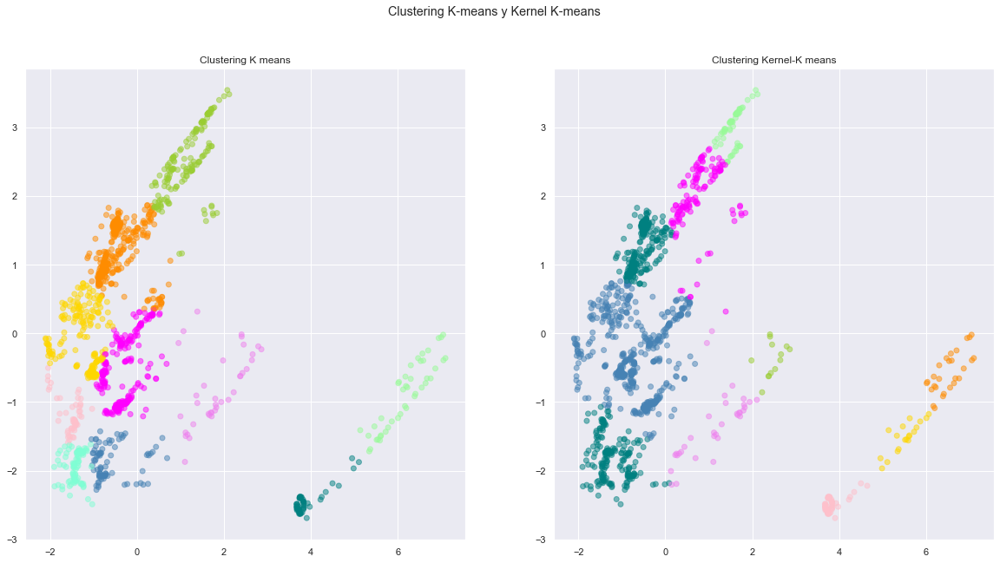

In [115]:
#Comparacion de metodos
fig = plt.figure() 
fig, axes = plt.subplots(nrows = 1, ncols = 2,figsize=(20,10))

fig.suptitle('Clustering K-means y Kernel K-means')
axes[0].scatter(X_hsv_new[:,0], X_hsv_new[:,1], c=[c_map[_] for _ in X_hsv_new[:,2]], alpha=0.5)
axes[0].title.set_text('Clustering K means')
axes[1].scatter(X_new_kh[:,0], X_new_kh[:,1], c=[c_map[_] for _ in X_new_kh[:,2]], alpha=0.5)
axes[1].title.set_text('Clustering Kernel-K means')